In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import os
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sb
import scrublet
from matplotlib.pyplot import rc_context
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams["font.sans-serif"] = "Arial"
%config InlineBackend.figure_format = 'retina'
sc.settings.set_figure_params(dpi=50, dpi_save=300, figsize=(5, 5),color_map='Reds')

In [2]:
pip show tensorflow

Name: tensorflow
Version: 2.11.0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /disk211/public/anaconda3/envs/labBase2/lib/python3.8/site-packages
Requires: absl-py, astunparse, flatbuffers, gast, google-pasta, grpcio, h5py, keras, libclang, numpy, opt-einsum, packaging, protobuf, setuptools, six, tensorboard, tensorflow-estimator, tensorflow-io-gcs-filesystem, termcolor, typing-extensions, wrapt
Required-by: scaden
Note: you may need to restart the kernel to use updated packages.


In [17]:
pip show scanpy

Name: scanpy
Version: 1.9.8
Summary: Single-Cell Analysis in Python.
Home-page: 
Author: Alex Wolf, Philipp Angerer, Fidel Ramirez, Isaac Virshup, Sergei Rybakov, Gokcen Eraslan, Tom White, Malte Luecken, Davide Cittaro, Tobias Callies, Marius Lange, Andrés R. Muñoz-Rojas
Author-email: 
License: 
Location: /disk211/public/anaconda3/envs/labBase/lib/python3.8/site-packages
Requires: anndata, get-annotations, h5py, joblib, matplotlib, natsort, networkx, numba, numpy, packaging, pandas, patsy, scikit-learn, scipy, seaborn, session-info, statsmodels, tqdm, umap-learn
Required-by: celltypist, liana, muon, mvtcr, sc-utils, scalex, scanpy-utils, scArches, scdrs, scib, scib-metrics, scvelo, squidpy
Note: you may need to restart the kernel to use updated packages.


读入人、猪、小鼠肠道单细胞数据

In [ ]:
### human
human=sc.read_h5ad('/disk212/yupf/database/scRNA-seq/scanpy_analysis/public_data/Full_obj_log_counts_soupx_v2.h5ad')
### mouse
mouse=sc.read_h5ad('/disk212/yupf/database/scRNA-seq/publicdata/Mouse_gut/mmColon_single_cell_85K.h5ad')
### pig
pig=sc.read_h5ad('/disk212/yupf/database/scRNA-seq/NewAtlas/atlas_level3_v2.h5ad')

In [22]:
set1=set(human.var_names)
set2=set(mouse.var_names)
set3=set(pig.var_names)
genes_subset=list(set1&set2&set3)

In [169]:
# sc.tl.rank_genes_groups(human, groupby='category', mask_var=genes_subset,  groups='all', reference='rest', key_added='human_rank_lineage', corr_method='benjamini-hochberg')
human_DEG=sc.get.rank_genes_groups_df(human, group=None,  key='human_rank_lineage', pval_cutoff=0.01)

In [9]:
sc.tl.rank_genes_groups(pig, groupby='Lineage', mask_var=genes_subset,  groups='all', reference='rest', key_added='pig_rank_lineage', corr_method='benjamini-hochberg')
pig_DEG=sc.get.rank_genes_groups_df(pig, group=None,  key='pig_rank_lineage', pval_cutoff=0.05)

In [26]:
# sc.tl.rank_genes_groups(mouse, groupby='celltype_major', mask_var=genes_subset,  groups='all', reference='rest', key_added='mouse_rank_lineage', corr_method='benjamini-hochberg')
mouse_DEG=sc.get.rank_genes_groups_df(mouse, group=None,  key='mouse_rank_lineage', pval_cutoff=0.05)

#### 根据矩阵绘图

In [170]:
mouse_DEG=mouse_DEG[abs(mouse_DEG['logfoldchanges'])>4]
human_DEG=human_DEG[abs(human_DEG['logfoldchanges'])>4]
pig_DEG=pig_DEG[abs(pig_DEG['logfoldchanges'])>4]

In [122]:
pig_DEG.to_csv('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/pig_DEG.txt',sep='\t')
human_DEG.to_csv('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/human_DEG.txt',sep='\t')
mouse_DEG.to_csv('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/mouse_DEG.txt',sep='\t')

#### 根本表达矩阵绘图

In [23]:
import decoupler as dc

In [24]:
mouse_subset = mouse[:, mouse.var_names.isin(genes_subset)]
mouse_subset = mouse_subset[mouse_subset.obs['sample'].isin(['Normal1', 'Normal2', 'Normal3'])]
mouse_subset.layers['counts']=mouse_subset.X
mouse_bulk = dc.get_pseudobulk(
    mouse_subset,
    sample_col='celltype_major',
    groups_col=None,
    layer='counts',
    mode='sum',
    min_cells=10,
    min_counts=1000
)
mouse_bulk


In [25]:
pig_subset = pig[:, pig.var_names.isin(genes_subset)]
pig_subset.layers['counts']=pig_subset.X
pig_bulk = dc.get_pseudobulk(
    pig_subset,
    sample_col='Lineage',
    groups_col=None,
    layer='counts',
    mode='sum',
    min_cells=10,
    min_counts=1000
)
pig_bulk

In [26]:
human_subset = human[:, human.var_names.isin(genes_subset)]
human_subset.layers['counts']=human_subset.X
human_bulk = dc.get_pseudobulk(
    human_subset,
    sample_col='category',
    groups_col=None,
    layer='counts',
    mode='sum',
    min_cells=10,
    min_counts=1000
)
human_bulk

In [70]:
for pdata in [human_bulk,pig_bulk,mouse_bulk]:
    sc.pp.normalize_total(pdata, target_sum=1e4)
    sc.pp.log1p(pdata)
    sc.pp.scale(pdata, max_value=10)

In [74]:
pig_bulk

AnnData object with n_obs × n_vars = 8 × 11671
    obs: 'predicted_doublet', '_scvi_batch', '_scvi_labels', 'Lineage', 'psbulk_n_cells', 'psbulk_counts'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'log1p'
    layers: 'psbulk_props'

In [76]:
mouse_bulk.write('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/mouse_bulk.h5ad')
pig_bulk.write('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/pig_bulk.h5ad')
human_bulk.write('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/human_bulk.h5ad')

In [27]:
mouse_subset.write('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/mouse_subset_gene.h5ad')
pig_subset.write('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/pig_subset_gene.h5ad')
human_subset.write('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/human_subset_gene.h5ad')

In [85]:
human_df=human_bulk.T.to_df()
pig_df=pig_bulk.T.to_df()
mouse_df=mouse_bulk.T.to_df()

In [121]:
pig_df.to_csv('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/pig_matrix.txt',sep='\t')
mouse_df.to_csv('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/mouse_matrix.txt',sep='\t')
human_df.to_csv('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/human_matrix.txt',sep='\t')

In [87]:
human_df.columns

Index(['B cells', 'Endothelial', 'Epithelial', 'Mesenchymal', 'Myeloid',
       'Neuronal', 'Plasma cells', 'Red blood cells', 'T cells'],
      dtype='object')

In [88]:
pig_df.columns

Index(['B lineage', 'Endothelial lineage', 'Epithelial lineage',
       'Mesenchymal lineage', 'Myeloid lineage', 'Neuron Lineage', 'Red blood',
       'T/ILC lineage'],
      dtype='object')

In [89]:
mouse_df.columns

Index(['B cell', 'Endothelial cell', 'Epithelial cell', 'Fibroblast',
       'Myeloid cell', 'Smooth muscle cell', 'T cell'],
      dtype='object')

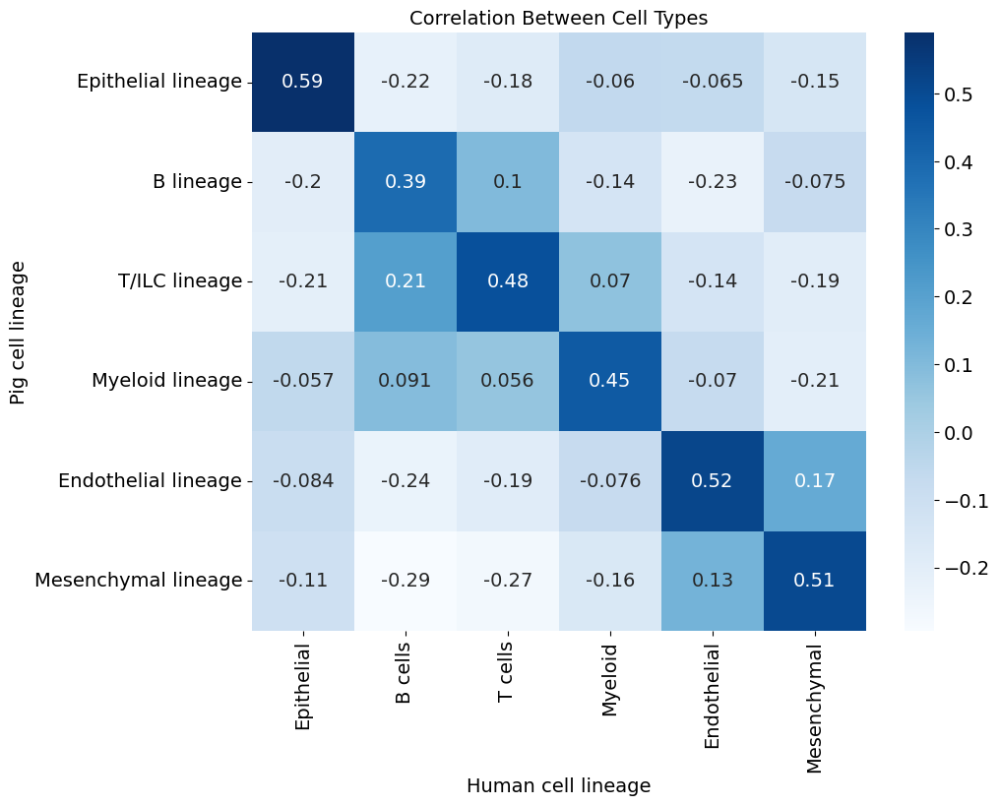

In [114]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

matrix1=pig_df[['Epithelial lineage','B lineage','T/ILC lineage', 'Myeloid lineage', 'Endothelial lineage', 
       'Mesenchymal lineage']]
matrix2=human_df[['Epithelial','B cells', 'T cells', 'Myeloid', 'Endothelial',  'Mesenchymal']]
genes = matrix1.index.intersection(matrix2.index)
matrix1_aligned = matrix1.loc[genes]
matrix2_aligned = matrix2.loc[genes]
correlation_results = pd.DataFrame(index=matrix1.columns, columns=matrix2.columns)

for celltype1 in matrix1.columns:
    for celltype2 in matrix2.columns:
        corr, _ = pearsonr(matrix1_aligned[celltype1], matrix2_aligned[celltype2])
        correlation_results.loc[celltype1, celltype2] = corr

# 绘制热图
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_results.astype(float), annot=True, cmap="Blues", cbar=True)
plt.title('Correlation Between Cell Types')
plt.xlabel('Human cell lineage')
plt.ylabel('Pig cell lineage')
plt.savefig('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/Pig_Human_Lineage_cor.pdf', dpi=300, bbox_inches='tight')
plt.show()

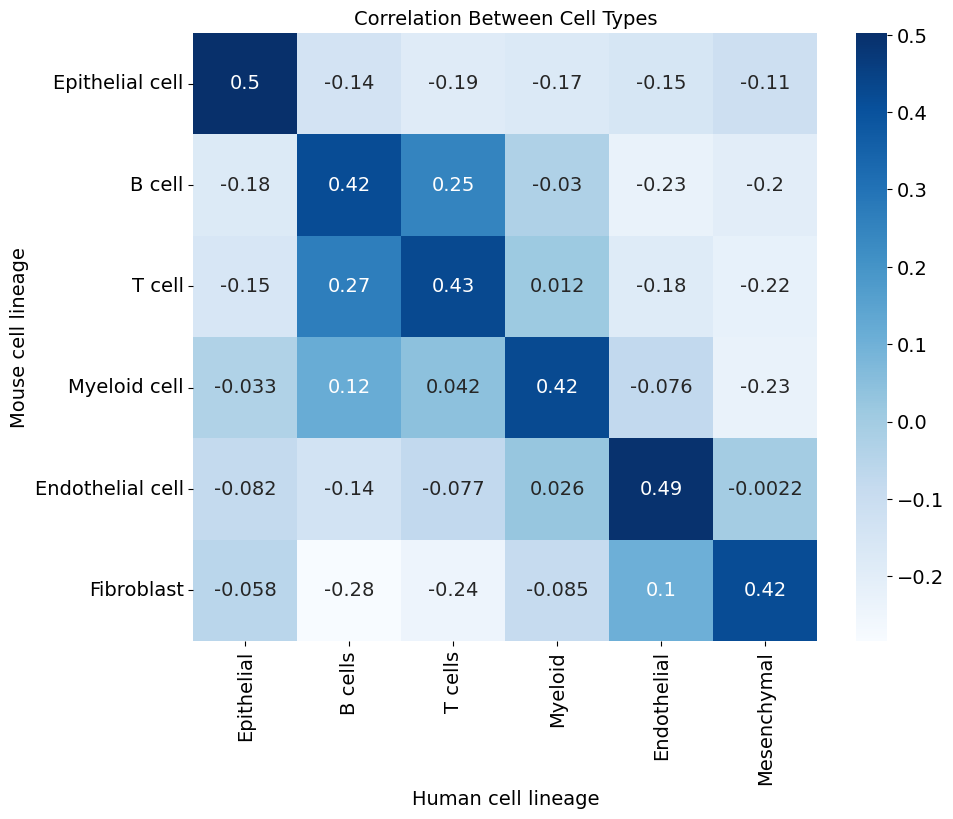

In [120]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import seaborn as sns
import matplotlib.pyplot as plt

matrix1=mouse_df[['Epithelial cell','B cell', 'T cell','Myeloid cell', 'Endothelial cell', 'Fibroblast']]
matrix2=human_df[['Epithelial','B cells', 'T cells', 'Myeloid', 'Endothelial',  'Mesenchymal']]
genes = matrix1.index.intersection(matrix2.index)
matrix1_aligned = matrix1.loc[genes]
matrix2_aligned = matrix2.loc[genes]
correlation_results = pd.DataFrame(index=matrix1.columns, columns=matrix2.columns)

for celltype1 in matrix1.columns:
    for celltype2 in matrix2.columns:
        corr, _ = pearsonr(matrix1_aligned[celltype1], matrix2_aligned[celltype2])
        correlation_results.loc[celltype1, celltype2] = corr

# 绘制热图
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_results.astype(float), annot=True, cmap="Blues", cbar=True)
plt.title('Correlation Between Cell Types')
plt.xlabel('Human cell lineage')
plt.ylabel('Mouse cell lineage')
plt.savefig('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/Mouse_Human_Lineage_cor.pdf', dpi=300, bbox_inches='tight')
plt.show()

按上皮谱系来看

In [201]:
human_epi_subset=human_subset[human_subset.obs['category']=='Epithelial']
pig_epi_subset=pig_subset[pig_subset.obs['Lineage']=='Epithelial lineage']
mouse_epi=mouse_epi[:, mouse_epi.var_names.isin(genes_subset)]
# mouse_epi_subset=mouse_epi[mouse_epi.obs['sample'].isin(['Normal1', 'Normal2', 'Normal3'])]
mouse_epi_subset=mouse_epi

In [202]:
epi={}
epi_bulk={}
epi_df={}
epi['human']=human_epi_subset
epi['pig']=pig_epi_subset
epi['mouse']=mouse_epi_subset
epi['mouse'].obs['CellType']=epi['mouse'].obs['CellType']
epi['human'].obs['CellType']=epi['human'].obs['Integrated_05']
for i in ['pig','human','mouse']:
    epi[i].layers['counts']=epi[i].X
    epi_bulk[i] = dc.get_pseudobulk(
        epi[i],
        sample_col='CellType',
        groups_col=None,
        layer='counts',
        mode='mean',
        min_cells=10,
        min_counts=1000
    )
    epi_df[i]=epi_bulk[i].T.to_df()

In [203]:
epi_DEG={}
for i in ['pig','human','mouse']:
    sc.tl.rank_genes_groups(epi[f'{i}'], groupby='CellType', mask_var=genes_subset,  groups='all', reference='rest', key_added=f'{i}_epi_rank_lineage', corr_method='benjamini-hochberg')
    epi_DEG[f'{i}']=sc.get.rank_genes_groups_df(epi[f'{i}'], group=None,  key=f'{i}_epi_rank_lineage', pval_cutoff=0.01)

/disk211/public/anaconda3/envs/labBase/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/disk211/public/anaconda3/envs/labBase/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:398: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/disk211/public/anaconda3/envs/labBase/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:401

In [110]:
pig_epi_df.columns

Index(['BEST4 enterocytes', 'Coloncytes', 'EECs', 'Enterocytes', 'Goblet',
       'Immature Enterocytes', 'Microfold', 'Paneth', 'TA', 'Tuft', 'stem'],
      dtype='object')

In [79]:
mouse_epi_df.columns

Index(['Coloncytes', 'EECs', 'Enterocytes', 'Goblet', 'TA', 'stem'], dtype='object')

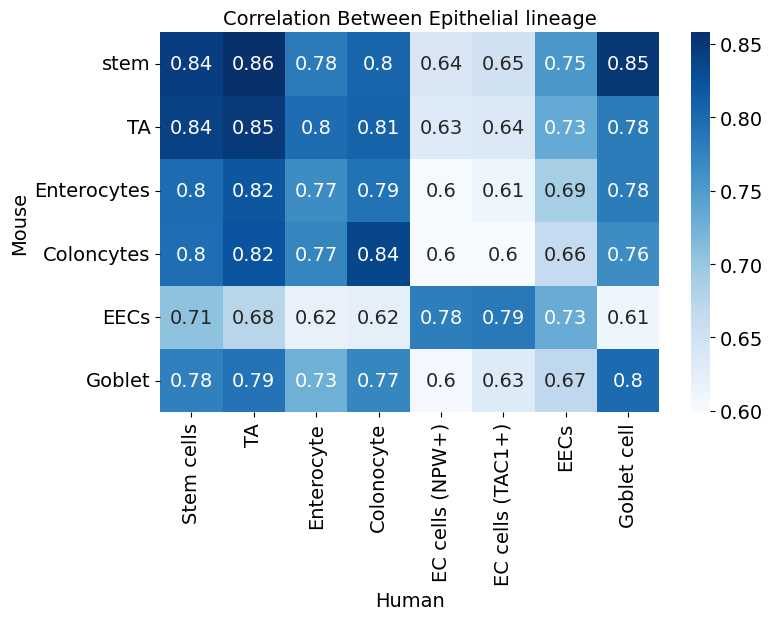

In [204]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import seaborn as sns
import matplotlib.pyplot as plt

matrix1=epi_df['mouse'][['stem', 'TA', 'Enterocytes','Coloncytes', 'EECs', 'Goblet'  ]]
matrix2=epi_df['human'][['Stem cells', 'TA','Enterocyte', 'Colonocyte','EC cells (NPW+)','EC cells (TAC1+)', 'EECs', 'Goblet cell']]
correlation_results = pd.DataFrame(index=matrix1.columns, columns=matrix2.columns)

for celltype1 in matrix1.columns:
    DEgene1=epi_DEG['mouse'][epi_DEG['mouse']['group']==celltype1]['names']
    matrix1_aligned=matrix1[[celltype1]][matrix1[[celltype1]].index.isin(DEgene1)]
    for celltype2 in matrix2.columns:
        try:
            DEgene2=epi_DEG['human'][epi_DEG['human']['group']==celltype2]['names']
            matrix2_aligned=matrix2[[celltype2]][matrix2[[celltype2]].index.isin(DEgene2)]
            genes = matrix1_aligned.index.intersection(matrix2_aligned.index)
            matrix1_aligned = matrix1_aligned.loc[genes]
            matrix2_aligned = matrix2_aligned.loc[genes]
            corr, _ = pearsonr(matrix1_aligned[celltype1], matrix2_aligned[celltype2])
            correlation_results.loc[celltype1, celltype2] = corr
        except:
            correlation_results.loc[celltype1, celltype2] = None


# 绘制热图
plt.figure(figsize=(8,5))
sns.heatmap(correlation_results.astype(float), annot=True, cmap="Blues", cbar=True)
plt.title('Correlation Between Epithelial lineage')
plt.xlabel('Human')
plt.ylabel('Mouse')
plt.grid(False) 
# plt.savefig('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/Mouse_Human_DEGepi_cor.pdf', dpi=300, bbox_inches='tight')
plt.show()

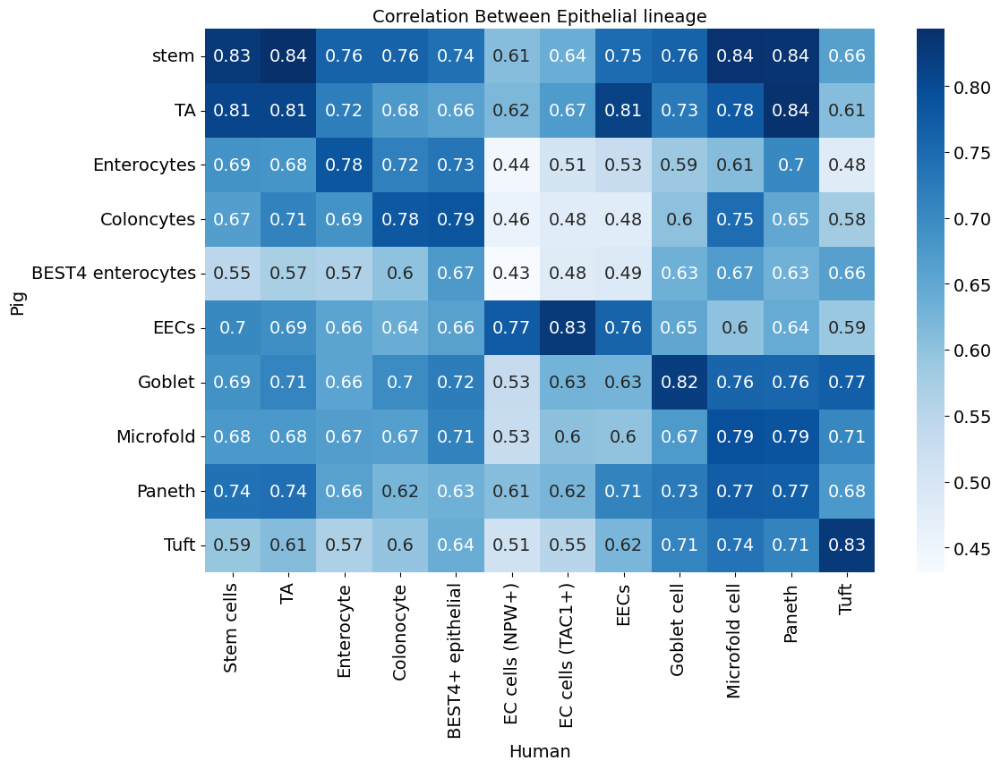

In [205]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import seaborn as sns
import matplotlib.pyplot as plt

matrix1=epi_df['pig'][['stem','TA', 'Enterocytes','Coloncytes','BEST4 enterocytes', 'EECs',  'Goblet', 'Microfold', 'Paneth',  'Tuft' ]]
matrix2=epi_df['human'][['Stem cells', 'TA','Enterocyte', 'Colonocyte','BEST4+ epithelial', 'EC cells (NPW+)','EC cells (TAC1+)', 'EECs', 'Goblet cell', 'Microfold cell', 'Paneth','Tuft']]
correlation_results = pd.DataFrame(index=matrix1.columns, columns=matrix2.columns)

for celltype1 in matrix1.columns:
    DEgene1=epi_DEG['pig'][epi_DEG['pig']['group']==celltype1]['names']
    matrix1_aligned=matrix1[[celltype1]][matrix1[[celltype1]].index.isin(DEgene1)]
    for celltype2 in matrix2.columns:
        try:
            DEgene2=epi_DEG['human'][epi_DEG['human']['group']==celltype2]['names']
            matrix2_aligned=matrix2[[celltype2]][matrix2[[celltype2]].index.isin(DEgene2)]
            genes = matrix1_aligned.index.intersection(matrix2_aligned.index)
            matrix1_aligned = matrix1_aligned.loc[genes]
            matrix2_aligned = matrix2_aligned.loc[genes]
            corr, _ = pearsonr(matrix1_aligned[celltype1], matrix2_aligned[celltype2])
            correlation_results.loc[celltype1, celltype2] = corr
        except:
            correlation_results.loc[celltype1, celltype2] = None


# 绘制热图
plt.figure(figsize=(12,8))
sns.heatmap(correlation_results.astype(float), annot=True, cmap="Blues", cbar=True)
plt.title('Correlation Between Epithelial lineage')
plt.xlabel('Human')
plt.ylabel('Pig')
plt.grid(False) 
# plt.savefig('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/Pig_Human_DEGepi_cor.pdf', dpi=300, bbox_inches='tight')
plt.show()

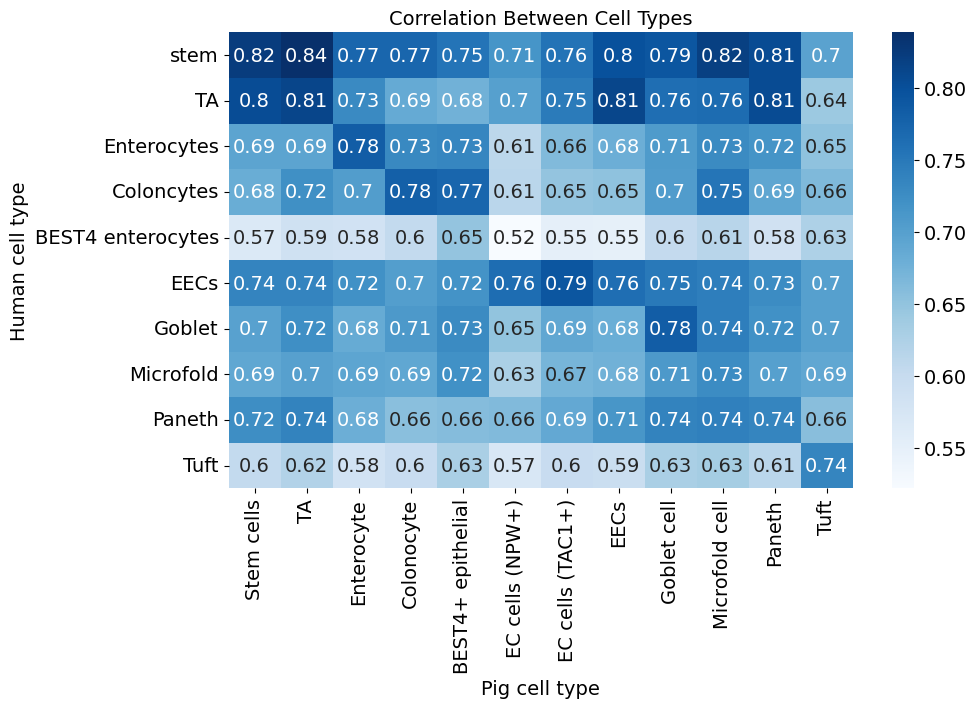

In [41]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import seaborn as sns
import matplotlib.pyplot as plt

matrix1=pig_epi_df[['stem','TA', 'Enterocytes','Coloncytes','BEST4 enterocytes', 'EECs',  'Goblet', 'Microfold', 'Paneth',  'Tuft' ]]
matrix2=human_epi_df[['Stem cells', 'TA','Enterocyte', 'Colonocyte','BEST4+ epithelial', 'EC cells (NPW+)','EC cells (TAC1+)', 'EECs', 'Goblet cell', 'Microfold cell', 'Paneth','Tuft']]
genes = matrix1.index.intersection(matrix2.index)
matrix1_aligned = matrix1.loc[genes]
matrix2_aligned = matrix2.loc[genes]
correlation_results = pd.DataFrame(index=matrix1.columns, columns=matrix2.columns)

for celltype1 in matrix1.columns:
    for celltype2 in matrix2.columns:
        corr, _ = pearsonr(matrix1_aligned[celltype1], matrix2_aligned[celltype2])
        correlation_results.loc[celltype1, celltype2] = corr

# 绘制热图
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_results.astype(float), annot=True, cmap="Blues", cbar=True)
plt.title('Correlation Between Cell Types')
plt.xlabel('Pig cell type')
plt.ylabel('Human cell type')
plt.grid(False) 
plt.show()

### myeloid

In [206]:
# mouse_subset = mouse_subset[mouse_subset.obs['sample'].isin(['Normal1', 'Normal2', 'Normal3'])]
mouse_mye=mouse_subset[mouse_subset.obs['celltype_major']=='Myeloid cell']
human_mye=human_subset[human_subset.obs['category']=='Myeloid']
pig_mye=pig_subset[pig_subset.obs['Lineage']=='Myeloid lineage']

In [212]:
mye={}
mye_bulk={}
mye_df={}
mye['human']=human_mye
mye['pig']=pig_mye
mye['mouse']=mouse_mye
mye['mouse'].obs['CellType']=mye['mouse'].obs['celltype_minor']
mye['human'].obs['CellType']=mye['human'].obs['Integrated_05']
for i in ['pig','human','mouse']:
    mye[i].layers['counts']=mye[i].X
    mye_bulk[i] = dc.get_pseudobulk(
        mye[i],
        sample_col='CellType',
        groups_col=None,
        layer='counts',
        mode='mean',
        min_cells=10,
        min_counts=1000
    )
    mye_df[i]=mye_bulk[i].T.to_df()

In [213]:
mye_DEG={}
for i in ['pig','human','mouse']:
    sc.tl.rank_genes_groups(mye[f'{i}'], groupby='CellType', mask_var=genes_subset,  groups='all', reference='rest', key_added=f'{i}_mye_rank_lineage', corr_method='benjamini-hochberg')
    mye_DEG[f'{i}']=sc.get.rank_genes_groups_df(mye[f'{i}'], group=None,  key=f'{i}_mye_rank_lineage', pval_cutoff=0.01)

In [215]:
mye_DEG['mouse']['group'].cat.categories

Index(['Dendritic cell', 'Macrophage', 'Monocyte'], dtype='object')

In [118]:
mye_DEG['human']['group'].cat.categories

Index(['CLC+ Mast cell', 'LYVE1+ Macrophage', 'Lymphoid DC',
       'MMP9+ Inflammatory macrophage', 'MPO+ mono-neutrophil', 'Macrophages',
       'Mast cell', 'Megakaryocyte', 'Monocytes', 'cDC1', 'cDC2', 'pDC'],
      dtype='object')

In [119]:
mye_DEG['pig']['group'].cat.categories

Index(['Macrophage', 'Mast', 'Monocyte', 'Dendritic', 'Plasmacytoid DCs'], dtype='object')

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 46 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'E', 'H', 'I', 'L', 'M', 'P', 'V', 'Y', 'a', 'c', 'd', 'e', 'eight', 'f', 'five', 'four', 'g', 'h', 'i', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'plus', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'w', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 14, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 37, 38, 39, 40, 43, 44, 47, 48, 51, 57, 60, 68, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 90, 92]
Closed glyph list over 'GSUB': 51 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'E', 'H', 'I', 'L', 'M', 'P', 'V', 'Y', 'a', 'c', 'd', 'e', 'eight', 'f', 'fi', 'five', 'fl', 'four', 'g', 'h', 'i', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'plus', 'r

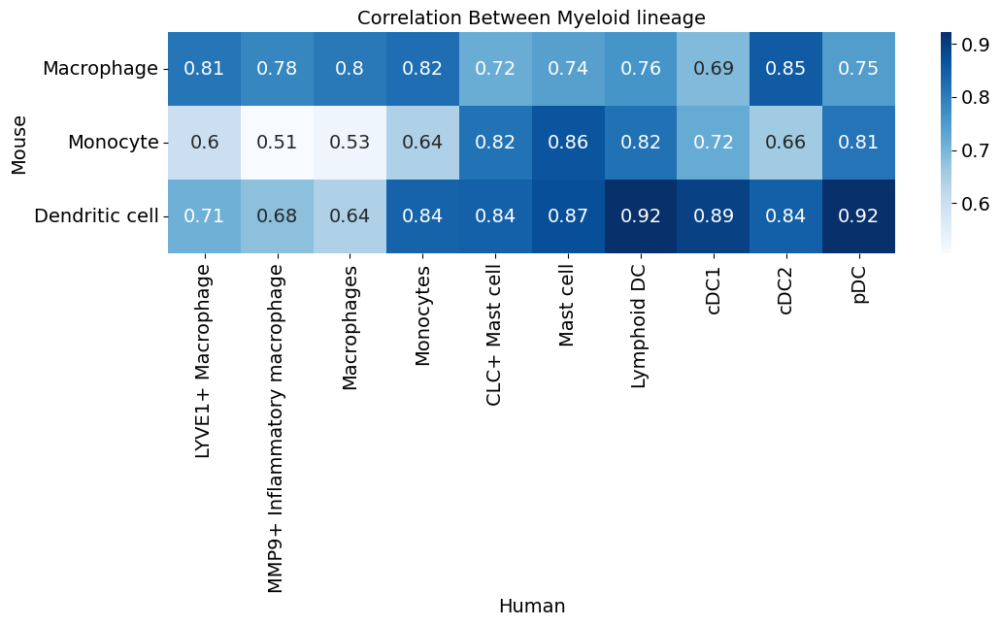

In [220]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import seaborn as sns
import matplotlib.pyplot as plt

# matrix1=mye_df['mouse'][['Macrophage (M2A)', 'Macrophage (M2B)','Macrophage (M2C)', 'Macrophage (M2D)', 'Monocyte','DC (Classical)', 'DC (Inflammatory)', 'DC (Plasmacytoid)']]
matrix1=mye_df['mouse'][['Macrophage', 'Monocyte','Dendritic cell']]
matrix2=mye_df['human'][['LYVE1+ Macrophage', 'MMP9+ Inflammatory macrophage',  'Macrophages','Monocytes','CLC+ Mast cell', 'Mast cell', 'Lymphoid DC','cDC1', 'cDC2', 'pDC']]
correlation_results = pd.DataFrame(index=matrix1.columns, columns=matrix2.columns)

for celltype1 in matrix1.columns:
    DEgene1=mye_DEG['mouse'][mye_DEG['mouse']['group']==celltype1]['names']
    matrix1_aligned=matrix1[[celltype1]][matrix1[[celltype1]].index.isin(DEgene1)]
    for celltype2 in matrix2.columns:
        try:
            DEgene2=mye_DEG['human'][mye_DEG['human']['group']==celltype2]['names']
            matrix2_aligned=matrix2[[celltype2]][matrix2[[celltype2]].index.isin(DEgene2)]
            genes = matrix1_aligned.index.intersection(matrix2_aligned.index)
            matrix1_aligned = matrix1_aligned.loc[genes]
            matrix2_aligned = matrix2_aligned.loc[genes]
            corr, _ = pearsonr(matrix1_aligned[celltype1], matrix2_aligned[celltype2])
            correlation_results.loc[celltype1, celltype2] = corr
        except:
            correlation_results.loc[celltype1, celltype2] = None


# 绘制热图
plt.figure(figsize=(12, 3))
sns.heatmap(correlation_results.astype(float), annot=True, cmap="Blues", cbar=True)
plt.title('Correlation Between Myeloid lineage')
plt.xlabel('Human')
plt.ylabel('Mouse')
plt.grid(False) 
plt.savefig('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/mouse_Human_DEGmye_cor.pdf', dpi=300, bbox_inches='tight')
plt.show()

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 46 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'E', 'H', 'I', 'L', 'M', 'P', 'V', 'Y', 'a', 'c', 'd', 'e', 'eight', 'f', 'five', 'four', 'g', 'h', 'i', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'plus', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'w', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 14, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 37, 38, 39, 40, 43, 44, 47, 48, 51, 57, 60, 68, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 90, 92]
Closed glyph list over 'GSUB': 51 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'E', 'H', 'I', 'L', 'M', 'P', 'V', 'Y', 'a', 'c', 'd', 'e', 'eight', 'f', 'fi', 'five', 'fl', 'four', 'g', 'h', 'i', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'plus', 'r

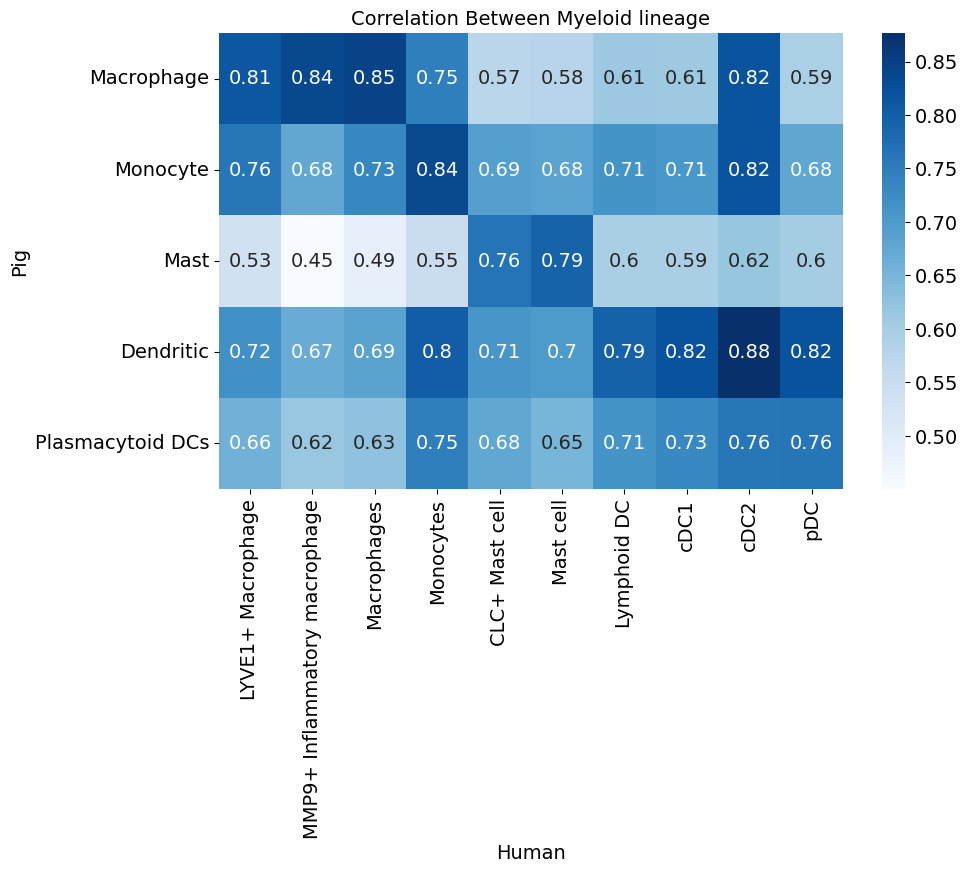

In [210]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import seaborn as sns
import matplotlib.pyplot as plt

matrix1=mye_df['pig'][['Macrophage', 'Monocyte', 'Mast', 'Dendritic', 'Plasmacytoid DCs']]
matrix2=mye_df['human'][['LYVE1+ Macrophage', 'MMP9+ Inflammatory macrophage',  'Macrophages','Monocytes','CLC+ Mast cell', 'Mast cell', 'Lymphoid DC','cDC1', 'cDC2', 'pDC']]
correlation_results = pd.DataFrame(index=matrix1.columns, columns=matrix2.columns)

for celltype1 in matrix1.columns:
    DEgene1=mye_DEG['pig'][mye_DEG['pig']['group']==celltype1]['names']
    matrix1_aligned=matrix1[[celltype1]][matrix1[[celltype1]].index.isin(DEgene1)]
    for celltype2 in matrix2.columns:
        try:
            DEgene2=mye_DEG['human'][mye_DEG['human']['group']==celltype2]['names']
            matrix2_aligned=matrix2[[celltype2]][matrix2[[celltype2]].index.isin(DEgene2)]
            genes = matrix1_aligned.index.intersection(matrix2_aligned.index)
            matrix1_aligned = matrix1_aligned.loc[genes]
            matrix2_aligned = matrix2_aligned.loc[genes]
            corr, _ = pearsonr(matrix1_aligned[celltype1], matrix2_aligned[celltype2])
            correlation_results.loc[celltype1, celltype2] = corr
        except:
            correlation_results.loc[celltype1, celltype2] = None


# 绘制热图
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_results.astype(float), annot=True, cmap="Blues", cbar=True)
plt.title('Correlation Between Myeloid lineage')
plt.xlabel('Human')
plt.ylabel('Pig')
plt.grid(False) 
plt.savefig('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/Pig_Human_DEGmye_cor.pdf', dpi=300, bbox_inches='tight')
plt.show()

In [145]:
correlation_results

,LYVE1+ Macrophage,MMP9+ Inflammatory macrophage,Macrophages,Monocytes,CLC+ Mast cell,Mast cell,Lymphoid DC,cDC1,cDC2,pDC
Macrophage,0.812501,0.837323,0.846505,0.747416,0.571922,0.577061,0.612355,0.61147,0.81838,0.593483
Monocyte,0.760536,0.676707,0.734864,0.835487,0.693114,0.683511,0.712959,0.706535,0.81854,0.679613
Mast,0.534235,0.450183,0.486403,0.550038,0.764516,0.792542,0.596136,0.594986,0.617203,0.60251
Dendritic,0.717749,0.66796,0.686343,0.803343,0.709706,0.701504,0.794671,0.821355,0.876758,0.821636
Plasmacytoid DCs,0.657339,0.615384,0.626265,0.748113,0.677877,0.651031,0.712468,0.733194,0.758808,0.761825


### T 

In [239]:
mouse_T=mouse_subset[mouse_subset.obs['celltype_major']=='T cell']
human_T=human_subset[human_subset.obs['category']=='T cells']
pig_T=pig_subset[pig_subset.obs['Lineage']=='T/ILC lineage']
T={}
T_bulk={}
T_df={}
T_DEG={}
T['human']=human_T
T['pig']=pig_T
T['mouse']=mouse_T
T['mouse'].obs['CellType']=T['mouse'].obs['celltype_minor']
T['human'].obs['CellType']=T['human'].obs['Integrated_05']
for i in ['pig','human','mouse']:
    T[i].layers['counts']=T[i].X
    T_bulk[i] = dc.get_pseudobulk(
        T[i],
        sample_col='CellType',
        groups_col=None,
        layer='counts',
        mode='mean',
        min_cells=10,
        min_counts=1000
    )
    T_df[i]=T_bulk[i].T.to_df()
    sc.tl.rank_genes_groups(T[f'{i}'], groupby='CellType', mask_var=genes_subset,  groups='all', reference='rest', key_added=f'{i}_T_rank_lineage', corr_method='benjamini-hochberg')
    T_DEG[f'{i}']=sc.get.rank_genes_groups_df(T[f'{i}'], group=None,  key=f'{i}_T_rank_lineage', pval_cutoff=0.01)

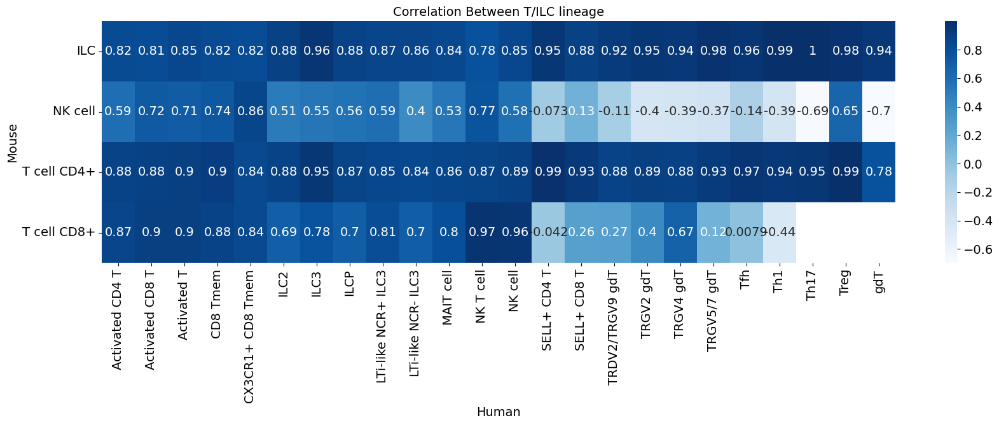

In [238]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import seaborn as sns
import matplotlib.pyplot as plt

# matrix1=T_df['mouse'][['Macrophage (M2A)', 'Macrophage (M2B)','Macrophage (M2C)', 'Macrophage (M2D)', 'Monocyte','DC (Classical)', 'DC (Inflammatory)', 'DC (Plasmacytoid)']]
matrix1=T_df['mouse']
matrix2=T_df['human']
correlation_results = pd.DataFrame(index=matrix1.columns, columns=matrix2.columns)

for celltype1 in matrix1.columns:
    DEgene1=T_DEG['mouse'][T_DEG['mouse']['group']==celltype1]['names']
    matrix1_aligned=matrix1[[celltype1]][matrix1[[celltype1]].index.isin(DEgene1)]
    for celltype2 in matrix2.columns:
        try:
            DEgene2=T_DEG['human'][T_DEG['human']['group']==celltype2]['names']
            matrix2_aligned=matrix2[[celltype2]][matrix2[[celltype2]].index.isin(DEgene2)]
            genes = matrix1_aligned.index.intersection(matrix2_aligned.index)
            matrix1_aligned = matrix1_aligned.loc[genes]
            matrix2_aligned = matrix2_aligned.loc[genes]
            corr, _ = pearsonr(matrix1_aligned[celltype1], matrix2_aligned[celltype2])
            correlation_results.loc[celltype1, celltype2] = corr
        except:
            correlation_results.loc[celltype1, celltype2] = None


# 绘制热图
plt.figure(figsize=(20, 5))
sns.heatmap(correlation_results.astype(float), annot=True, cmap="Blues", cbar=True)
plt.title('Correlation Between T/ILC lineage')
plt.xlabel('Human')
plt.ylabel('Mouse')
plt.grid(False) 
# plt.savefig('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/mouse_Human_DEGT_cor.pdf', dpi=300, bbox_inches='tight')
plt.show()

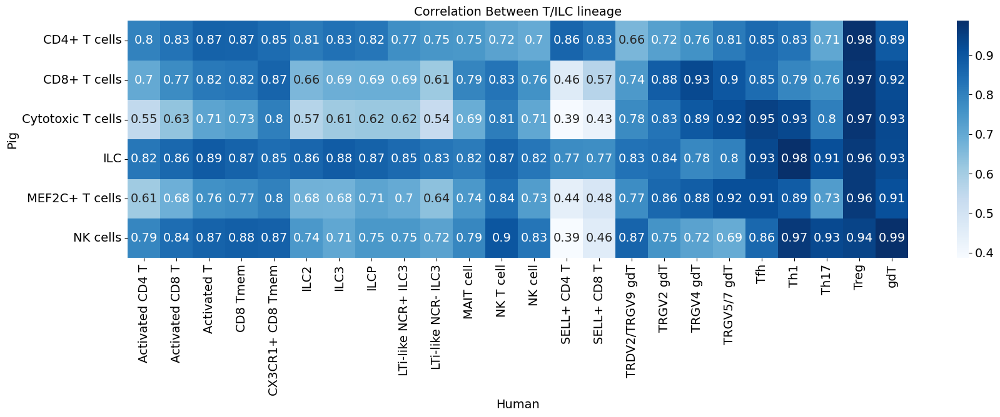

In [234]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import seaborn as sns
import matplotlib.pyplot as plt

# matrix1=T_df['pig'][['Macrophage (M2A)', 'Macrophage (M2B)','Macrophage (M2C)', 'Macrophage (M2D)', 'Monocyte','DC (Classical)', 'DC (Inflammatory)', 'DC (Plasmacytoid)']]
matrix1=T_df['pig']
matrix2=T_df['human']
correlation_results = pd.DataFrame(index=matrix1.columns, columns=matrix2.columns)

for celltype1 in matrix1.columns:
    DEgene1=T_DEG['pig'][T_DEG['pig']['group']==celltype1]['names']
    matrix1_aligned=matrix1[[celltype1]][matrix1[[celltype1]].index.isin(DEgene1)]
    for celltype2 in matrix2.columns:
        try:
            DEgene2=T_DEG['human'][T_DEG['human']['group']==celltype2]['names']
            matrix2_aligned=matrix2[[celltype2]][matrix2[[celltype2]].index.isin(DEgene2)]
            genes = matrix1_aligned.index.intersection(matrix2_aligned.index)
            matrix1_aligned = matrix1_aligned.loc[genes]
            matrix2_aligned = matrix2_aligned.loc[genes]
            corr, _ = pearsonr(matrix1_aligned[celltype1], matrix2_aligned[celltype2])
            correlation_results.loc[celltype1, celltype2] = corr
        except:
            correlation_results.loc[celltype1, celltype2] = None


# 绘制热图
plt.figure(figsize=(20, 5))
sns.heatmap(correlation_results.astype(float), annot=True, cmap="Blues", cbar=True)
plt.title('Correlation Between T/ILC lineage')
plt.xlabel('Human')
plt.ylabel('Pig')
plt.grid(False) 
# plt.savefig('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/pig_Human_DEGT_cor.pdf', dpi=300, bbox_inches='tight')
plt.show()

B

In [ ]:
mouse_BC=mouse_subset[mouse_subset.obs['celltype_major']=='B cell']
human_BC=human_subset[human_subset.obs['category']=='B cells']
pig_BC=pig_subset[pig_subset.obs['Lineage']=='B lineage']
BC={}
BC_bulk={}
BC_df={}
BC_DEG={}
BC['human']=human_BC
BC['pig']=pig_BC
BC['mouse']=mouse_BC
BC['mouse'].obs['CellType']=BC['mouse'].obs['celltype_minor']
BC['human'].obs['CellType']=BC['human'].obs['Integrated_05']
for i in ['pig','human','mouse']:
    BC[i].layers['counts']=BC[i].X
    BC_bulk[i] = dc.get_pseudobulk(
        BC[i],
        sample_col='CellType',
        groups_col=None,
        layer='counts',
        mode='mean',
        min_cells=10,
        min_counts=1000
    )
    BC_df[i]=BC_bulk[i].T.to_df()
    sc.tl.rank_genes_groups(BC[f'{i}'], groupby='CellType', mask_var=genes_subset,  groups='all', reference='rest', key_added=f'{i}_B_rank_lineage', corr_method='benjamini-hochberg')
    BC_DEG[f'{i}']=sc.get.rank_genes_groups_df(BC[f'{i}'], group=None,  key=f'{i}_B_rank_lineage', pval_cutoff=0.01)

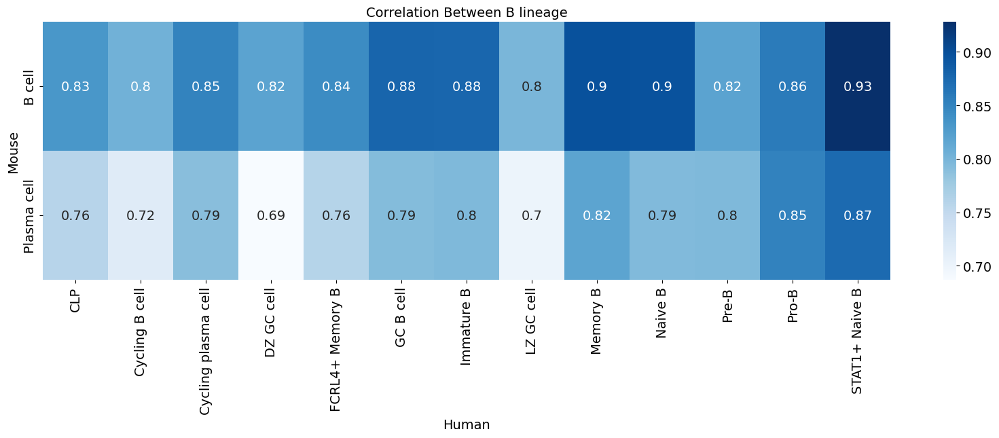

In [241]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import seaborn as sns
import matplotlib.pyplot as plt

# matrix1=BC_df['mouse'][['Macrophage (M2A)', 'Macrophage (M2B)','Macrophage (M2C)', 'Macrophage (M2D)', 'Monocyte','DC (Classical)', 'DC (Inflammatory)', 'DC (Plasmacytoid)']]
matrix1=BC_df['mouse']
matrix2=BC_df['human']
correlation_results = pd.DataFrame(index=matrix1.columns, columns=matrix2.columns)

for celltype1 in matrix1.columns:
    DEgene1=BC_DEG['mouse'][BC_DEG['mouse']['group']==celltype1]['names']
    matrix1_aligned=matrix1[[celltype1]][matrix1[[celltype1]].index.isin(DEgene1)]
    for celltype2 in matrix2.columns:
        try:
            DEgene2=BC_DEG['human'][BC_DEG['human']['group']==celltype2]['names']
            matrix2_aligned=matrix2[[celltype2]][matrix2[[celltype2]].index.isin(DEgene2)]
            genes = matrix1_aligned.index.intersection(matrix2_aligned.index)
            matrix1_aligned = matrix1_aligned.loc[genes]
            matrix2_aligned = matrix2_aligned.loc[genes]
            corr, _ = pearsonr(matrix1_aligned[celltype1], matrix2_aligned[celltype2])
            correlation_results.loc[celltype1, celltype2] = corr
        except:
            correlation_results.loc[celltype1, celltype2] = None


# 绘制热图
plt.figure(figsize=(20, 5))
sns.heatmap(correlation_results.astype(float), annot=True, cmap="Blues", cbar=True)
plt.title('Correlation Between B lineage')
plt.xlabel('Human')
plt.ylabel('Mouse')
plt.grid(False) 
# plt.savefig('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/mouse_Human_DEGT_cor.pdf', dpi=300, bbox_inches='tight')
plt.show()

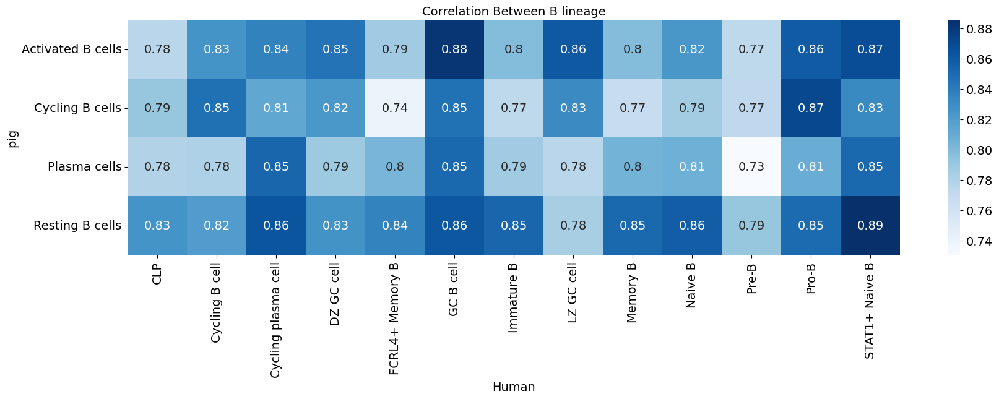

In [242]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import seaborn as sns
import matplotlib.pyplot as plt

# matrix1=BC_df['pig'][['Macrophage (M2A)', 'Macrophage (M2B)','Macrophage (M2C)', 'Macrophage (M2D)', 'Monocyte','DC (Classical)', 'DC (Inflammatory)', 'DC (Plasmacytoid)']]
matrix1=BC_df['pig']
matrix2=BC_df['human']
correlation_results = pd.DataFrame(index=matrix1.columns, columns=matrix2.columns)

for celltype1 in matrix1.columns:
    DEgene1=BC_DEG['pig'][BC_DEG['pig']['group']==celltype1]['names']
    matrix1_aligned=matrix1[[celltype1]][matrix1[[celltype1]].index.isin(DEgene1)]
    for celltype2 in matrix2.columns:
        try:
            DEgene2=BC_DEG['human'][BC_DEG['human']['group']==celltype2]['names']
            matrix2_aligned=matrix2[[celltype2]][matrix2[[celltype2]].index.isin(DEgene2)]
            genes = matrix1_aligned.index.intersection(matrix2_aligned.index)
            matrix1_aligned = matrix1_aligned.loc[genes]
            matrix2_aligned = matrix2_aligned.loc[genes]
            corr, _ = pearsonr(matrix1_aligned[celltype1], matrix2_aligned[celltype2])
            correlation_results.loc[celltype1, celltype2] = corr
        except:
            correlation_results.loc[celltype1, celltype2] = None


# 绘制热图
plt.figure(figsize=(20, 5))
sns.heatmap(correlation_results.astype(float), annot=True, cmap="Blues", cbar=True)
plt.title('Correlation Between B lineage')
plt.xlabel('Human')
plt.ylabel('pig')
plt.grid(False) 
# plt.savefig('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/pig_Human_DEGT_cor.pdf', dpi=300, bbox_inches='tight')
plt.show()

endo

In [247]:
mouse_all=mouse_subset
human_all=human_subset
pig_all=pig_subset
all={}
all_bulk={}
all_df={}
all_DEG={}
all['human']=human_all
all['pig']=pig_all
all['mouse']=mouse_all
all['mouse'].obs['CellType']=all['mouse'].obs['celltype_minor']
all['human'].obs['CellType']=all['human'].obs['Integrated_05']
for i in ['pig','human','mouse']:
    all[i].layers['counts']=all[i].X
    all_bulk[i] = dc.get_pseudobulk(
        all[i],
        sample_col='CellType',
        groups_col=None,
        layer='counts',
        mode='mean',
        min_cells=10,
        min_counts=1000
    )
    all_df[i]=all_bulk[i].T.to_df()
    sc.tl.rank_genes_groups(all[f'{i}'], groupby='CellType', mask_var=genes_subset,  groups='all', reference='rest', key_added=f'{i}_all_rank_lineage', corr_method='benjamini-hochberg')
    all_DEG[f'{i}']=sc.get.rank_genes_groups_df(all[f'{i}'], group=None,  key=f'{i}_all_rank_lineage', pval_cutoff=0.01)

/disk211/public/anaconda3/envs/labBase/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/disk211/public/anaconda3/envs/labBase/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:398: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/disk211/public/anaconda3/envs/labBase/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:401

/disk211/public/anaconda3/envs/labBase/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/disk211/public/anaconda3/envs/labBase/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:398: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/disk211/public/anaconda3/envs/labBase/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:401

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 70 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z', 'a', 'b', 'beta', 'c', 'd', 'e', 'eight', 'f', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'm', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'plus', 'r', 's', 'seven', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'underscore', 'v', 'w', 'x', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 11, 12, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 37, 38, 39, 40, 41, 42, 43, 44, 46, 47, 48, 49, 50, 51, 53, 54, 55, 56, 57, 58, 59, 60, 61, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 90, 91, 92, 838, 3228]
Closed glyph list over 'GSUB': 7

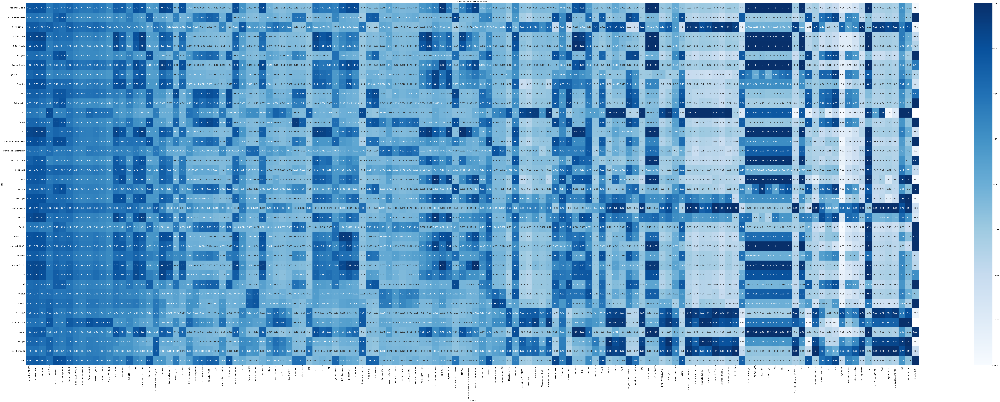

In [252]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import seaborn as sns
import matplotlib.pyplot as plt

# matrix1=all_df['pig'][['Macrophage (M2A)', 'Macrophage (M2B)','Macrophage (M2C)', 'Macrophage (M2D)', 'Monocyte','DC (Classical)', 'DC (Inflammatory)', 'DC (Plasmacytoid)']]
matrix1=all_df['pig']
matrix2=all_df['human']
correlation_results = pd.DataFrame(index=matrix1.columns, columns=matrix2.columns)

for celltype1 in matrix1.columns:
    DEgene1=all_DEG['pig'][all_DEG['pig']['group']==celltype1]['names']
    matrix1_aligned=matrix1[[celltype1]][matrix1[[celltype1]].index.isin(DEgene1)]
    for celltype2 in matrix2.columns:
        try:
            DEgene2=all_DEG['human'][all_DEG['human']['group']==celltype2]['names']
            matrix2_aligned=matrix2[[celltype2]][matrix2[[celltype2]].index.isin(DEgene2)]
            genes = matrix1_aligned.index.intersection(matrix2_aligned.index)
            matrix1_aligned = matrix1_aligned.loc[genes]
            matrix2_aligned = matrix2_aligned.loc[genes]
            corr, _ = pearsonr(matrix1_aligned[celltype1], matrix2_aligned[celltype2])
            correlation_results.loc[celltype1, celltype2] = corr
        except:
            correlation_results.loc[celltype1, celltype2] = None


# 绘制热图
plt.figure(figsize=(150, 50))
sns.heatmap(correlation_results.astype(float), annot=True, cmap="Blues", cbar=True)
plt.title('Correlation Between all celltype')
plt.xlabel('Human')
plt.ylabel('pig')
plt.grid(False) 
plt.savefig('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/pig_Human_DEG_all_cor.pdf', dpi=300, bbox_inches='tight')
plt.show()

In [254]:
correlation_results.to_csv('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/pig_human_all_cor.txt',sep='\t')

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 69 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z', 'a', 'b', 'beta', 'c', 'd', 'e', 'eight', 'f', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'm', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'plus', 'r', 's', 'seven', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'v', 'w', 'x', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 11, 12, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 37, 38, 39, 40, 41, 42, 43, 44, 46, 47, 48, 49, 50, 51, 53, 54, 55, 56, 57, 58, 59, 60, 61, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 90, 91, 92, 838, 3228]
Closed glyph list over 'GSUB': 74 glyphs after
Gly

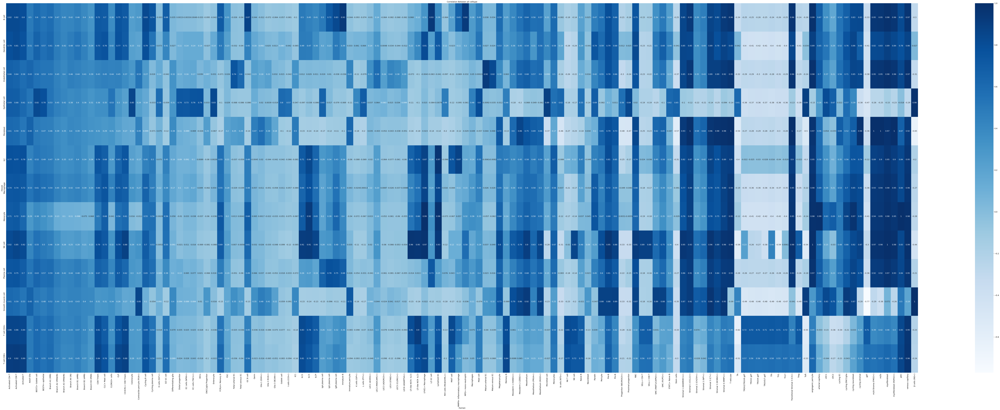

In [255]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import seaborn as sns
import matplotlib.pyplot as plt

# matrix1=all_df['mouse'][['Macrophage (M2A)', 'Macrophage (M2B)','Macrophage (M2C)', 'Macrophage (M2D)', 'Monocyte','DC (Classical)', 'DC (Inflammatory)', 'DC (Plasmacytoid)']]
matrix1=all_df['mouse']
matrix2=all_df['human']
correlation_results = pd.DataFrame(index=matrix1.columns, columns=matrix2.columns)

for celltype1 in matrix1.columns:
    DEgene1=all_DEG['mouse'][all_DEG['mouse']['group']==celltype1]['names']
    matrix1_aligned=matrix1[[celltype1]][matrix1[[celltype1]].index.isin(DEgene1)]
    for celltype2 in matrix2.columns:
        try:
            DEgene2=all_DEG['human'][all_DEG['human']['group']==celltype2]['names']
            matrix2_aligned=matrix2[[celltype2]][matrix2[[celltype2]].index.isin(DEgene2)]
            genes = matrix1_aligned.index.intersection(matrix2_aligned.index)
            matrix1_aligned = matrix1_aligned.loc[genes]
            matrix2_aligned = matrix2_aligned.loc[genes]
            corr, _ = pearsonr(matrix1_aligned[celltype1], matrix2_aligned[celltype2])
            correlation_results.loc[celltype1, celltype2] = corr
        except:
            correlation_results.loc[celltype1, celltype2] = None


# 绘制热图
plt.figure(figsize=(150, 50))
sns.heatmap(correlation_results.astype(float), annot=True, cmap="Blues", cbar=True)
plt.title('Correlation Between all celltype')
plt.xlabel('Human')
plt.ylabel('mouse')
plt.grid(False) 
plt.savefig('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/mouse_Human_DEG_all_cor.pdf', dpi=300, bbox_inches='tight')
plt.show()

In [256]:
correlation_results.to_csv('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/mouse_human_all_cor.txt',sep='\t')

Lineage DEG

In [257]:
mouse_subset

AnnData object with n_obs × n_vars = 28271 × 11671
    obs: 'sid', 'n_genes', 'condition', 'batch', 'sample', 'celltype_major', 'celltype_minor', 'celltype_subset', 'CellType'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_stat', 'GSA_down', 'GSA_up', 'celltype_major_colors', 'celltype_minor_colors', 'celltype_subset_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'sample_colors', 'umap', 'mouse_B_rank_lineage'
    obsm: 'HiCAT_result', 'X_pca', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [258]:
mouse_all=mouse_subset
human_all=human_subset
pig_all=pig_subset
all={}
all_bulk={}
all_df={}
all_DEG={}
all['human']=human_all
all['pig']=pig_all
all['mouse']=mouse_all
all['mouse'].obs['Lineage']=all['mouse'].obs['celltype_major']
all['human'].obs['Lineage']=all['human'].obs['category']
for i in ['pig','human','mouse']:
    all[i].layers['counts']=all[i].X
    all_bulk[i] = dc.get_pseudobulk(
        all[i],
        sample_col='Lineage',
        groups_col=None,
        layer='counts',
        mode='mean',
        min_cells=10,
        min_counts=1000
    )
    all_df[i]=all_bulk[i].T.to_df()
    sc.tl.rank_genes_groups(all[f'{i}'], groupby='Lineage', mask_var=genes_subset,  groups='all', reference='rest', key_added=f'{i}_all_rank_lineage', corr_method='benjamini-hochberg')
    all_DEG[f'{i}']=sc.get.rank_genes_groups_df(all[f'{i}'], group=None,  key=f'{i}_all_rank_lineage', pval_cutoff=0.01)

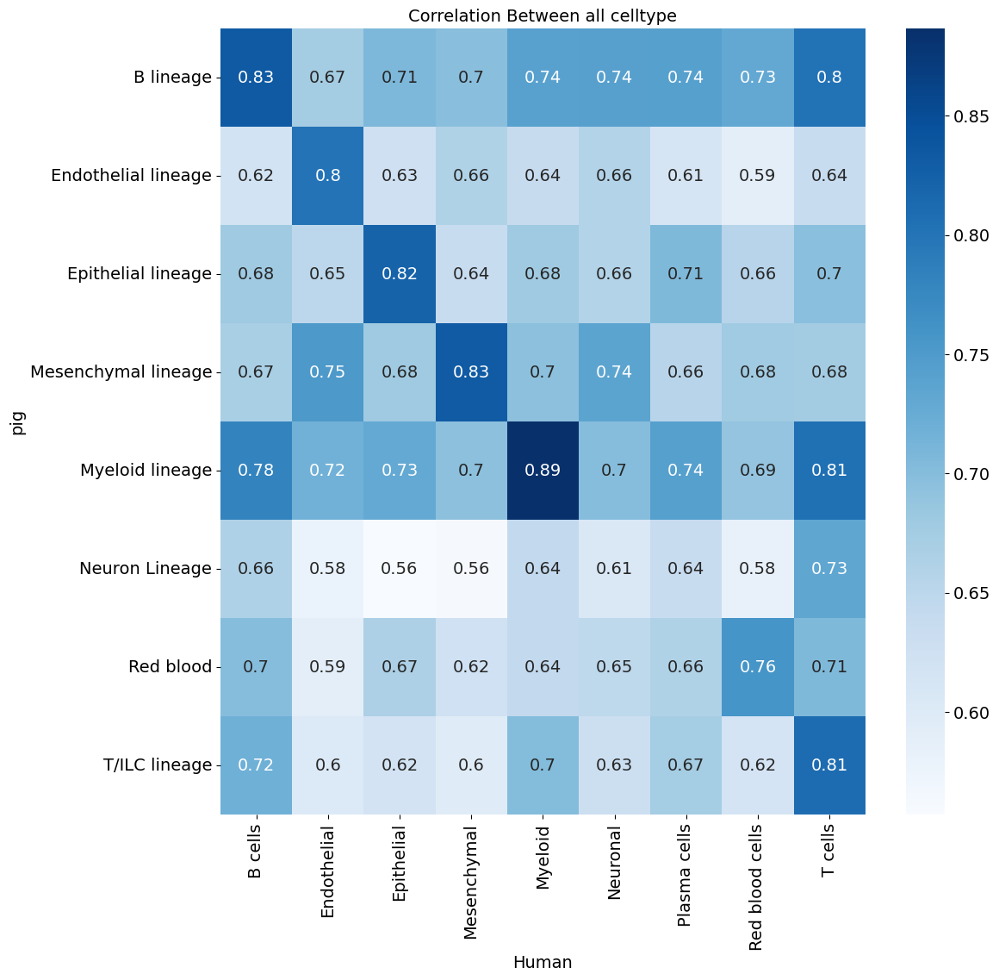

In [261]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import seaborn as sns
import matplotlib.pyplot as plt

# matrix1=all_df['pig'][['Macrophage (M2A)', 'Macrophage (M2B)','Macrophage (M2C)', 'Macrophage (M2D)', 'Monocyte','DC (Classical)', 'DC (Inflammatory)', 'DC (Plasmacytoid)']]
matrix1=all_df['pig']
matrix2=all_df['human']
correlation_results = pd.DataFrame(index=matrix1.columns, columns=matrix2.columns)

for celltype1 in matrix1.columns:
    DEgene1=all_DEG['pig'][all_DEG['pig']['group']==celltype1]['names']
    matrix1_aligned=matrix1[[celltype1]][matrix1[[celltype1]].index.isin(DEgene1)]
    for celltype2 in matrix2.columns:
        try:
            DEgene2=all_DEG['human'][all_DEG['human']['group']==celltype2]['names']
            matrix2_aligned=matrix2[[celltype2]][matrix2[[celltype2]].index.isin(DEgene2)]
            genes = matrix1_aligned.index.intersection(matrix2_aligned.index)
            matrix1_aligned = matrix1_aligned.loc[genes]
            matrix2_aligned = matrix2_aligned.loc[genes]
            corr, _ = pearsonr(matrix1_aligned[celltype1], matrix2_aligned[celltype2])
            correlation_results.loc[celltype1, celltype2] = corr
        except:
            correlation_results.loc[celltype1, celltype2] = None


# 绘制热图
plt.figure(figsize=(12, 12))
sns.heatmap(correlation_results.astype(float), annot=True, cmap="Blues", cbar=True)
plt.title('Correlation Between all celltype')
plt.xlabel('Human')
plt.ylabel('pig')
plt.grid(False) 
# plt.savefig('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/pig_Human_DEG_all_cor.pdf', dpi=300, bbox_inches='tight')
plt.show()

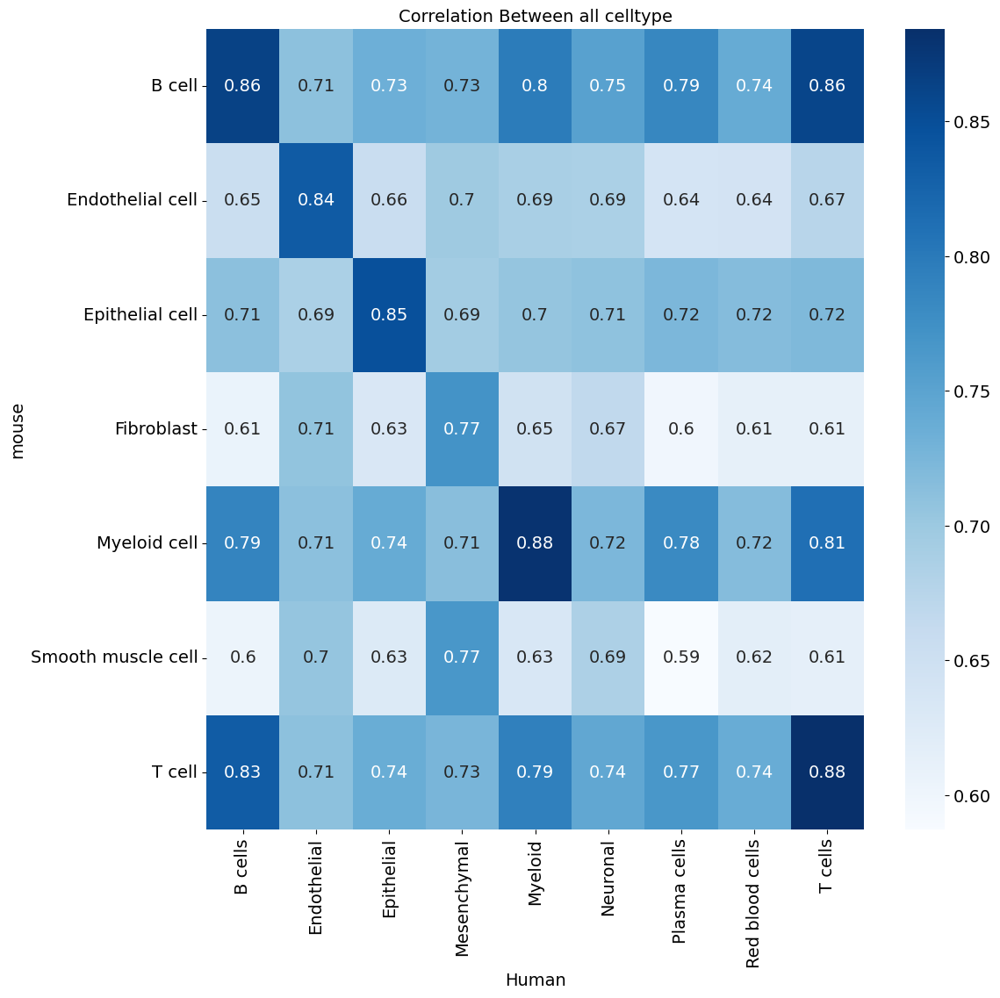

In [260]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import seaborn as sns
import matplotlib.pyplot as plt

# matrix1=all_df['mouse'][['Macrophage (M2A)', 'Macrophage (M2B)','Macrophage (M2C)', 'Macrophage (M2D)', 'Monocyte','DC (Classical)', 'DC (Inflammatory)', 'DC (Plasmacytoid)']]
matrix1=all_df['mouse']
matrix2=all_df['human']
correlation_results = pd.DataFrame(index=matrix1.columns, columns=matrix2.columns)

for celltype1 in matrix1.columns:
    DEgene1=all_DEG['mouse'][all_DEG['mouse']['group']==celltype1]['names']
    matrix1_aligned=matrix1[[celltype1]][matrix1[[celltype1]].index.isin(DEgene1)]
    for celltype2 in matrix2.columns:
        try:
            DEgene2=all_DEG['human'][all_DEG['human']['group']==celltype2]['names']
            matrix2_aligned=matrix2[[celltype2]][matrix2[[celltype2]].index.isin(DEgene2)]
            genes = matrix1_aligned.index.intersection(matrix2_aligned.index)
            matrix1_aligned = matrix1_aligned.loc[genes]
            matrix2_aligned = matrix2_aligned.loc[genes]
            corr, _ = pearsonr(matrix1_aligned[celltype1], matrix2_aligned[celltype2])
            correlation_results.loc[celltype1, celltype2] = corr
        except:
            correlation_results.loc[celltype1, celltype2] = None


# 绘制热图
plt.figure(figsize=(12, 12))
sns.heatmap(correlation_results.astype(float), annot=True, cmap="Blues", cbar=True)
plt.title('Correlation Between all celltype')
plt.xlabel('Human')
plt.ylabel('mouse')
plt.grid(False) 
# plt.savefig('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/mouse_Human_DEG_all_cor.pdf', dpi=300, bbox_inches='tight')
plt.show()

### 雷达图

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 45 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'G', 'I', 'K', 'L', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'i', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'plus', 'r', 's', 'seven', 'space', 't', 'u', 'underscore', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 14, 17, 19, 20, 23, 26, 27, 28, 36, 37, 38, 39, 40, 42, 44, 46, 47, 48, 49, 51, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 92]
Closed glyph list over 'GSUB': 50 glyphs after
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'G', 'I', 'K', 'L', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'i', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'plus', 'r', '

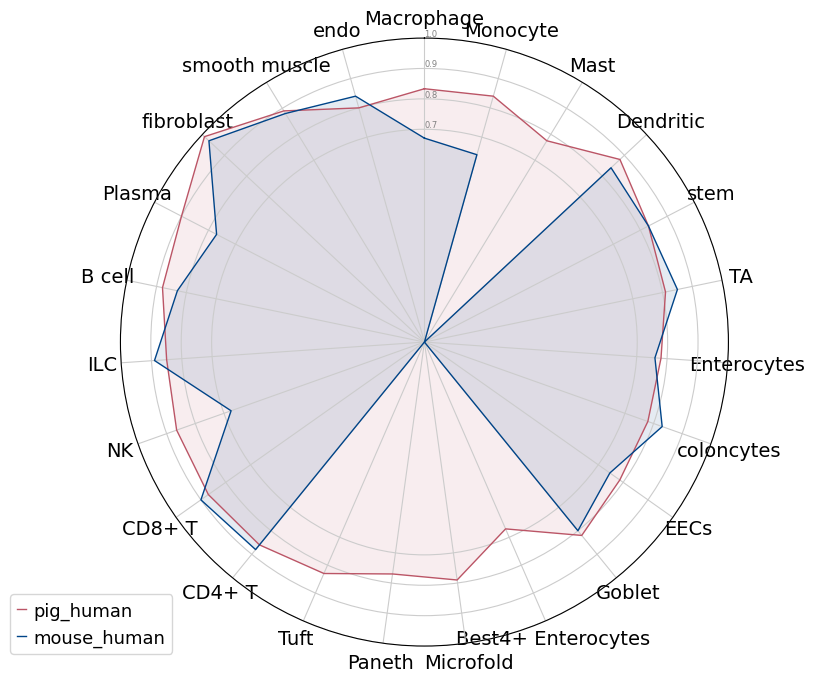

In [264]:
df=pd.read_csv('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/celltype_cor_cross.txt',sep='\t').set_index('celltype').T.reset_index()
import matplotlib.pyplot as plt
import pandas as pd
from math import pi

# 假设你已经有一个数据框 df
# df = pd.DataFrame(...)

# ------- PART 1: Create background

# number of variables
categories = list(df)[1:]
N = len(categories)

# What will be the angle of each axis in the plot? (we divide the plot / number of variable)
angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

# Initialise the spider plot
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

# If you want the first axis to be on top:
ax.set_theta_offset(pi / 2)
ax.set_theta_direction(-1)

# Draw one axe per variable + add labels
plt.xticks(angles[:-1], categories)

# Draw ylabels
ax.set_rlabel_position(0)
plt.yticks([0.7, 0.8, 0.9, 1.0], ["0.7", "0.8", "0.9", '1.0'], color="grey", size=6)
plt.ylim(0, 1)

# ------- PART 2: Add plots

# Plot each individual = each line of the data
# I don't make a loop, because plotting more than 3 groups makes the chart unreadable

# Ind1
values = df.loc[0].drop('index').values.flatten().tolist()
values += values[:1]
ax.plot(angles, values, linewidth=1, linestyle='solid', label='pig_human',color='#BB5566FF')
ax.fill(angles, values, '#BB5566FF', alpha=0.1)

# Ind2
values = df.loc[1].drop('index').values.flatten().tolist()
values += values[:1]
ax.plot(angles, values, linewidth=1, linestyle='solid', label='mouse_human',color='#004488FF')
ax.fill(angles, values, '#004488FF', alpha=0.1)

# Add legend
plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))
# plt.grid(False)
plt.savefig('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/raderplot.pdf', dpi=300, bbox_inches='tight')
# Show the graph
plt.show()

# Save the figure
# fig.savefig("radar_chart.png")


In [19]:
import matplotlib.pyplot as plt
import pandas as pd
from math import pi

df=pd.read_csv('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/celltype_cor_cross.txt',sep='\t')

In [20]:
df

,celltype,pig-human,mouse-human
0,Macrophage,0.833333,0.670800
1,Monocyte,0.840000,0.640000
2,Mast,0.775000,0.000000
3,Dendritic,0.880000,0.840000
4,stem,0.830000,0.830000
5,TA,0.810000,0.850000
6,Enterocytes,0.780000,0.760000
7,coloncytes,0.780000,0.830000
8,EECs,0.786667,0.746667
9,Goblet,0.820000,0.800000


fuxian

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib.lines import Line2D
from matplotlib import font_manager

import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning) 

In [35]:
df=pd.read_csv('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/celltype_cor_cross.txt',sep='\t')
df

,celltype,pig-human,mouse-human
0,Macrophage,0.833333,0.670800
1,Monocyte,0.840000,0.640000
2,Mast,0.775000,0.000000
3,Dendritic,0.880000,0.840000
4,stem,0.830000,0.830000
5,TA,0.810000,0.850000
6,Enterocytes,0.780000,0.760000
7,coloncytes,0.780000,0.830000
8,EECs,0.786667,0.746667
9,Goblet,0.820000,0.800000


In [38]:
df=pd.read_csv('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/celltype_cor_cross.txt',sep='\t')

# print first rows to check it's all looking ok
df.head()

# calculate corect angular position in circular bar plot
x_max = 2*np.pi
df['angular_pos'] = np.linspace(0, x_max, len(df), endpoint=False)


# fill with neutral color for secondary characters
# df['colors'] = df['colors'].fillna(chart_colors['other'])

In [39]:
df

,celltype,pig-human,mouse-human,angular_pos
0,Macrophage,0.833333,0.670800,0.000000
1,Monocyte,0.840000,0.640000,0.273182
2,Mast,0.775000,0.000000,0.546364
3,Dendritic,0.880000,0.840000,0.819546
4,stem,0.830000,0.830000,1.092728
5,TA,0.810000,0.850000,1.365910
6,Enterocytes,0.780000,0.760000,1.639092
7,coloncytes,0.780000,0.830000,1.912274
8,EECs,0.786667,0.746667,2.185456
9,Goblet,0.820000,0.800000,2.458638


#### UP AND DOWN

In [117]:
pig_DEG

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,Epithelial lineage,KRT8,609.290100,5.311716,0.0,0.0
1,Epithelial lineage,EPCAM,600.224670,5.750437,0.0,0.0
2,Epithelial lineage,LGALS4,514.495850,5.365228,0.0,0.0
3,Epithelial lineage,ENSSSCG00000017934,498.630219,5.572595,0.0,0.0
4,Epithelial lineage,KRT20,476.537415,5.309573,0.0,0.0
...,...,...,...,...,...,...
130873,Red blood,DIP2B,-462.924164,-29.125763,0.0,0.0
130874,Red blood,SMARCC1,-468.396454,-28.791706,0.0,0.0
130875,Red blood,DPYD,-483.822021,-29.418909,0.0,0.0
130876,Red blood,FAM172A,-496.651794,-29.331553,0.0,0.0


In [173]:
pig_DEG['up_pig'] = pig_DEG['logfoldchanges'].apply(lambda x: x > 0).astype(int)
pig_DEG['down_pig'] = pig_DEG['logfoldchanges'].apply(lambda x: x < 0).astype(int)
human_DEG['up_human'] = human_DEG['logfoldchanges'].apply(lambda x: x > 0).astype(int)
human_DEG['down_human'] = human_DEG['logfoldchanges'].apply(lambda x: x < 0).astype(int)
mouse_DEG['up_mouse'] = mouse_DEG['logfoldchanges'].apply(lambda x: x > 0).astype(int)
mouse_DEG['down_mouse'] = mouse_DEG['logfoldchanges'].apply(lambda x: x < 0).astype(int)

In [174]:
up_pig_count = pig_DEG.groupby('group')['up_pig'].sum()
down_pig_count = pig_DEG.groupby('group')['down_pig'].sum()
up_human_count = human_DEG.groupby('group')['up_human'].sum()
down_human_count = human_DEG.groupby('group')['down_human'].sum()
up_mouse_count = mouse_DEG.groupby('group')['up_mouse'].sum()
down_mouse_count = mouse_DEG.groupby('group')['down_mouse'].sum()

In [144]:
up_pig_count

group
Epithelial lineage     1182
B lineage               210
T/ILC lineage           167
Myeloid lineage         269
Endothelial lineage     684
Mesenchymal lineage     911
Neuron Lineage           56
Red blood                28
Name: up_pig, dtype: int64

In [175]:
up_human_count

group
B cells             291
Endothelial         397
Epithelial         1195
Mesenchymal         931
Myeloid             507
Neuronal            582
Plasma cells        342
Red blood cells     136
T cells             535
Name: up_human, dtype: int64

In [176]:
down_pig_count

group
Epithelial lineage       269
B lineage               2325
T/ILC lineage           1433
Myeloid lineage         1145
Endothelial lineage     1905
Mesenchymal lineage     1857
Neuron Lineage          2153
Red blood              13269
Name: down_pig, dtype: int64

In [177]:
down_human_count

group
B cells            7475
Endothelial        4502
Epithelial         3140
Mesenchymal        2547
Myeloid            6197
Neuronal           4525
Plasma cells       6566
Red blood cells    9427
T cells            6811
Name: down_human, dtype: int64

In [159]:
mousedf=pd.DataFrame({'mouse_up':up_mouse_count,'mouse_down':down_mouse_count})
pigdf=pd.DataFrame({'pig_up':up_pig_count,'pig_down':down_pig_count})
humandf=pd.DataFrame({'human_up':up_human_count,'human_down':down_human_count})

In [160]:
mousedf=mousedf.T[['Epithelial cell', 'B cell', 'T cell', 'Myeloid cell', 'Endothelial cell', 'Fibroblast']]
pigdf=pigdf.T[['Epithelial lineage', 'B lineage', 'T/ILC lineage', 'Myeloid lineage', 'Endothelial lineage', 'Mesenchymal lineage']]
humandf=humandf.T[['Epithelial','B cells','T cells', 'Myeloid','Endothelial',  'Mesenchymal']]

In [161]:
for data in [mousedf,pigdf,humandf]:
    data.columns=['Epithelial lineage', 'B lineage', 'T/ILC lineage', 'Myeloid lineage', 'Endothelial lineage', 'Mesenchymal lineage']

In [163]:
result=pd.concat([mousedf,pigdf,humandf],axis=0).T

In [168]:
human_DEG['logfoldchanges'].describe()

count    62344.000000
mean       -11.225078
std          7.630396
min        -30.149876
25%        -16.813699
50%        -14.493314
75%         -5.196246
max         20.377262
Name: logfoldchanges, dtype: float64

In [164]:
result

,mouse_up,mouse_down,pig_up,pig_down,human_up,human_down
Epithelial lineage,668,1103,1182,269,1259,3383
B lineage,124,2181,210,2325,306,8255
T/ILC lineage,228,1702,167,1433,572,7517
Myeloid lineage,261,1600,269,1145,539,7001
Endothelial lineage,339,380,684,1905,421,5238
Mesenchymal lineage,500,241,911,1857,993,2790


### 合并图谱

In [185]:
human_subset

View of AnnData object with n_obs × n_vars = 428469 × 11671
    obs: 'Sample name', 'Diagnosis', 'Age', 'sample name', 'Region code', 'Fraction', 'Gender', 'Region', '10X', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_scores', 'predicted_doublets', 'category', 'Age_group', 'Integrated_05'
    var: 'gene_ids', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'Integrated_colors', 'category2_colors', 'category_colors', "dendrogram_['Integrated']", "dendrogram_['Integrated_05']", 'hvg', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'

In [188]:
ap={}
ap['mouse']=sc.pp.subsample(mouse,n_obs=80000,copy=True)
ap['human']=sc.pp.subsample(human_subset,n_obs=80000,copy=True)
ap['pig']=sc.pp.subsample(pig_subset,n_obs=80000,copy=True)

In [190]:
adata=sc.concat(ap.values(),keys=ap.keys(),label='species',join='inner')
adata

AnnData object with n_obs × n_vars = 240000 × 11671
    obs: 'n_genes', 'species'
    obsm: 'X_umap'

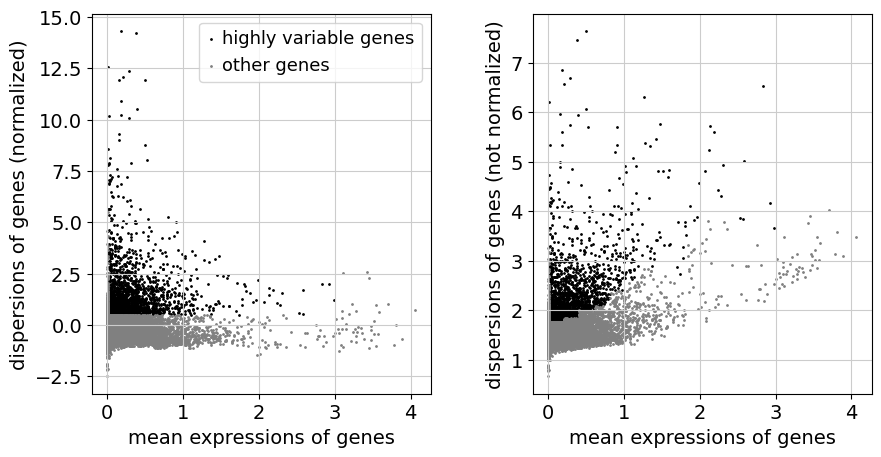

In [192]:
sc.pp.highly_variable_genes(adata,min_mean=0.0125,max_mean=3,min_disp=0.5)
sc.pl.highly_variable_genes(adata)
adata.raw = adata
adata = adata[:, adata.var.highly_variable]

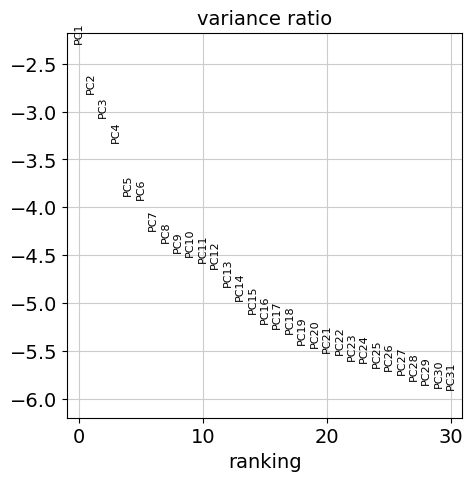

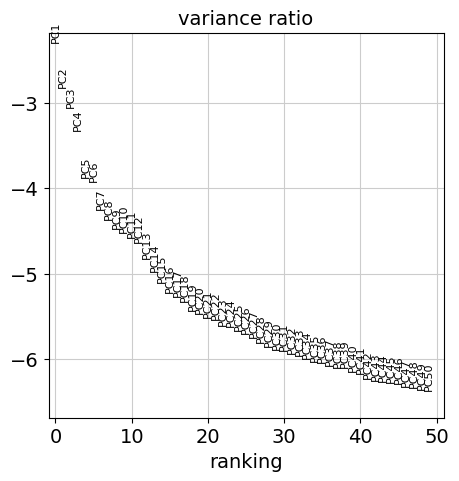

In [193]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata, log=True)
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50)

In [194]:
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=40)

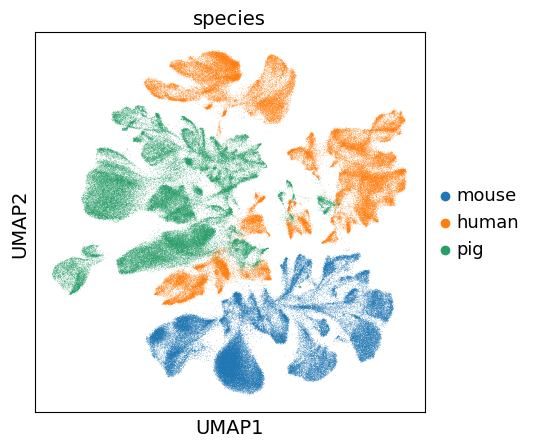

In [195]:
sc.tl.umap(adata)
sc.pl.umap(adata,color='species')

In [196]:
import scanpy.external as sce
sce.pp.harmony_integrate(adata, 'species')

2024-06-21 00:20:29,477 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
Computing initial centroids with sklearn.KMeans...
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fa3c76913a0>
Traceback (most recent call last):
  File "/disk211/public/anaconda3/envs/labBase/lib/python3.8/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/disk211/public/anaconda3/envs/labBase/lib/python3.8/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/disk211/public/anaconda3/envs/labBase/lib/python3.8/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/disk211/public/anaconda3/envs/labBase/lib/python3.8/site-packages/threadpoolctl.py", line 646, in get_version
    config

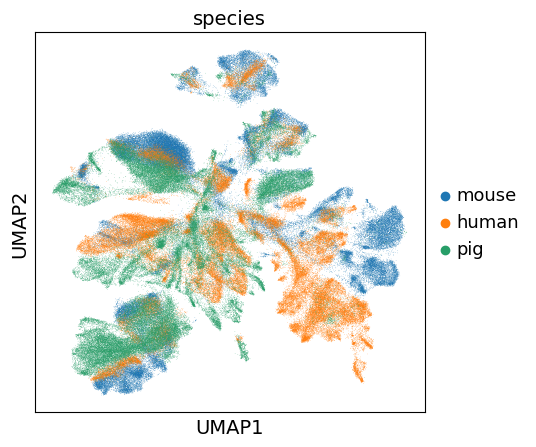

In [197]:
sc.pp.neighbors(adata, use_rep='X_pca_harmony')
sc.tl.umap(adata)
sc.pl.umap(adata,color='species')

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 18 glyphs before
Glyph names: ['.notdef', '.null', 'C', 'a', 'c', 'e', 'g', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'r', 's', 'space', 'u']
Glyph IDs:   [0, 1, 2, 3, 38, 68, 70, 72, 74, 75, 76, 80, 81, 82, 83, 85, 86, 88]
Closed glyph list over 'GSUB': 18 glyphs after
Glyph names: ['.notdef', '.null', 'C', 'a', 'c', 'e', 'g', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'r', 's', 'space', 'u']
Glyph IDs:   [0, 1, 2, 3, 38, 68, 70, 72, 74, 75, 76, 80, 81, 82, 83, 85, 86, 88]
Closing glyph list over 'MATH': 18 glyphs before
Glyph names: ['.notdef', '.null', 'C', 'a', 'c', 'e', 'g', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'r', 's', 'space', 'u']
Glyph IDs:   [0, 1, 2, 3, 38, 68, 70, 72, 74, 75, 76, 80, 81, 82, 83, 85, 86, 88]
Closed glyph list over 'MATH': 18 glyphs after
Glyph name

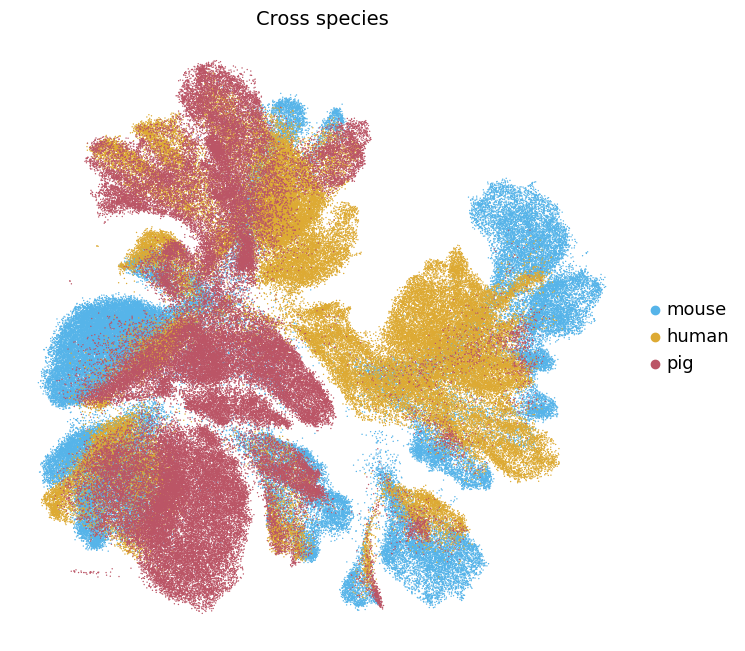

In [285]:
# sc.external.pp.bbknn(adata, batch_key='species', use_rep='X_pca', approx=True, use_annoy=True, metric='euclidean', copy=False, neighbors_within_batch=3, n_pcs=50)
# sc.tl.umap(adata)
# sc.settings.set_figure_params(dpi=50, dpi_save=300, figsize=(8, 8),color_map='Reds')
sc.pl.umap(adata,color='species',legend_fontweight='bold', title='Cross species',legend_fontoutline=5,size=4,frameon=False,save='_cross_species.pdf')

In [284]:
color=['#56B4E9FF', '#DDAA33FF', '#BB5566FF']
adata.uns['species_colors']=color

In [198]:
adata.write('/disk212/yupf/database/scRNA-seq/NewAtlas/cross_species/merged.h5ad')